# Imports

In [1]:
pip install wordcloud

In [2]:
pip install openpyxl

In [3]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
import pandas as pd
from collections import defaultdict
import re
import string

In [4]:
df = pd.read_excel("/work/merged_whole_with_topic.xlsx")

merged_whole_with_topic.xlsx is later called Main_All_HAnn_with_topics.xlxs in the files.

# Preprocessing

## Removing usernames

In [5]:
def remove_users(post):
    post = re.sub(r'@[^\s]+', '', post)
    post = re.sub(r'http[^\s]+', '', post)
    return post
    post = re.sub(r'\bclimate\b(?:[\s,\-\_:;]+)\bchange\b', '', post, flags=re.IGNORECASE)
    post = re.sub(r'\s+', ' ', post).strip()
    return post

In [6]:
df['text'] = df['text'].apply(lambda x: remove_users(x) if isinstance(x, str) else x)

## Removing 'climate change'

In [8]:
def remove_climate_change_phrase(text):

    tokens = text.split()
    cleaned_tokens = []
    i = 0
    while i < len(tokens):
        token_clean = tokens[i].strip(string.punctuation).lower()
        if i < len(tokens) - 1:
            next_token_clean = tokens[i+1].strip(string.punctuation).lower()
        else:
            next_token_clean = ""

        if token_clean == "climate" and next_token_clean == "change":
            i += 2
        else:
            cleaned_tokens.append(tokens[i])
            i += 1
    return " ".join(cleaned_tokens).strip()

def preprocess_text(post):
    if not isinstance(post, str):
        return post
    post = remove_users(post)
    post = remove_climate_change_phrase(post)
    post = re.sub(r'\s+', ' ', post).strip()
    return post

In [9]:
df['text'] = df['text'].apply(preprocess_text)

## Bias mapping

In [10]:
annotator_suffixes = ['_bs', '_fs', '_ir', '_wl']
known_biases = ['affect_h', 'availability_h', 'representativeness_h', 'confirmation_b', 'all_or_nothing']

bias_mapping = defaultdict(list)
for col in df.columns:
    if any(col.endswith(suffix) for suffix in annotator_suffixes):
        base = col.rsplit('_', 1)[0]
        bias_mapping[base].append(col)
    elif col in known_biases:
        bias_mapping[col].append(col)

print("Detected bias mapping:")
for base, cols in bias_mapping.items():
    print(f"{base}: {cols}")

for base, cols in bias_mapping.items():
    if len(cols) > 1:
        df[base] = df[cols].apply(lambda col: pd.to_numeric(col, errors='coerce').fillna(0) == 1).any(axis=1)
    else:
        df[base] = (pd.to_numeric(df[cols[0]], errors='coerce').fillna(0) == 1)

if 'affect_h' in df.columns:
    print("\nValue counts for affect_h:")
    print(df['affect_h'].value_counts())

Detected bias mapping:
affect_h: ['affect_h_bs', 'affect_h_fs', 'affect_h_ir', 'affect_h_wl']
availability_h: ['availability_h_bs', 'availability_h_fs', 'availability_h_ir', 'availability_h_wl']
representativeness_h: ['representativeness_h_bs', 'representativeness_h_fs', 'representativeness_h_ir', 'representativeness_h_wl']
confirmation_b: ['confirmation_b_bs', 'confirmation_b_fs', 'confirmation_b_ir', 'confirmation_b_wl']
all_or_nothing: ['all_or_nothing_bs', 'all_or_nothing_fs', 'all_or_nothing_ir', 'all_or_nothing_wl']

Value counts for affect_h:
affect_h
False    28411
True      2576
Name: count, dtype: int64


In [11]:
stopwords = set(STOPWORDS)
stopwords.update(['will', 'people', 's', 'u', 'AI', 'climate', 'think', 'thing', 'one'])

In [13]:
topics = ['climate', 'AI']
platforms = ['Reddit', 'Twitter']

# Each bias type

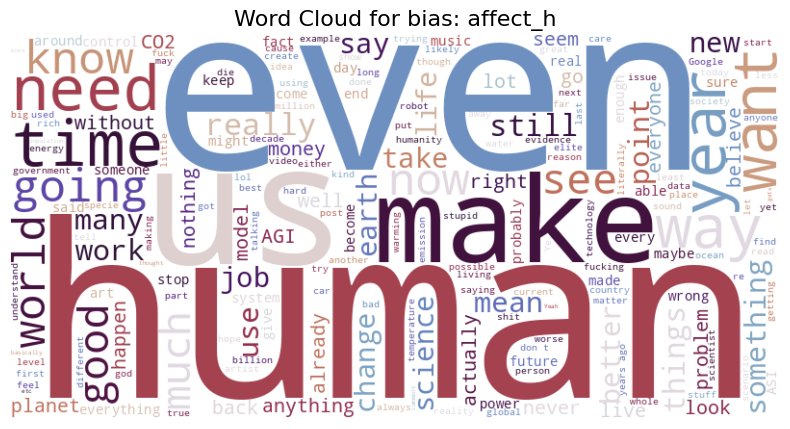

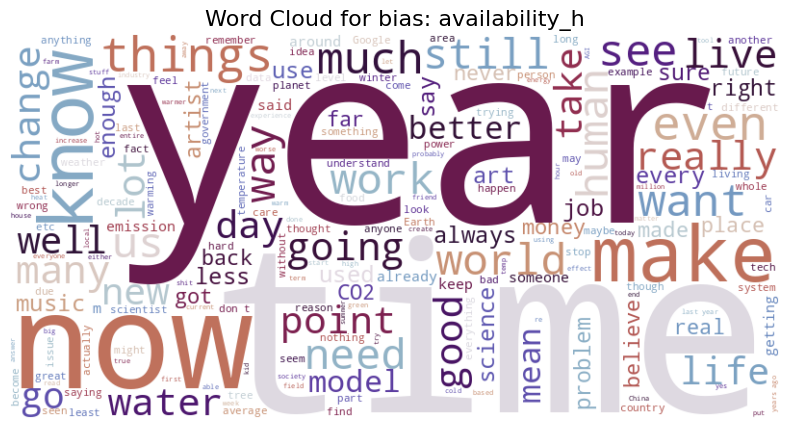

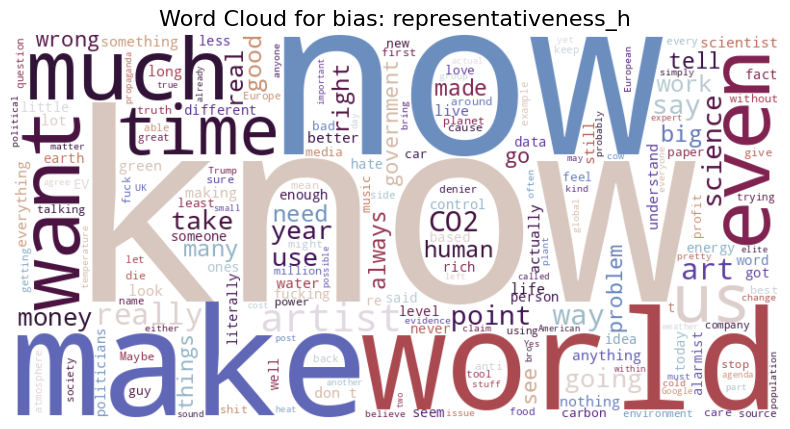

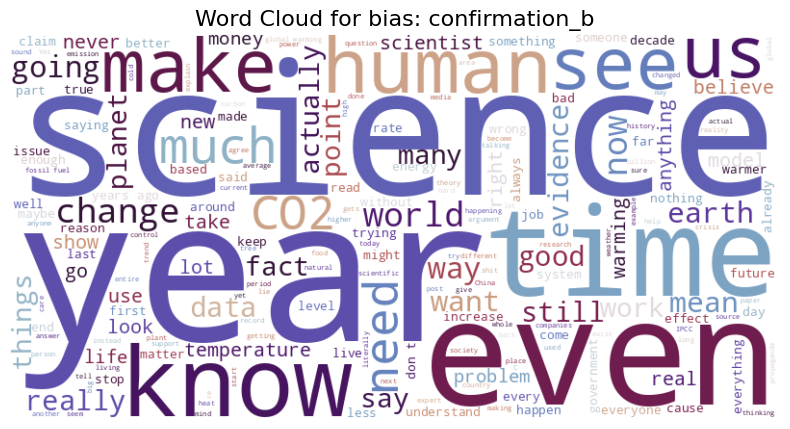

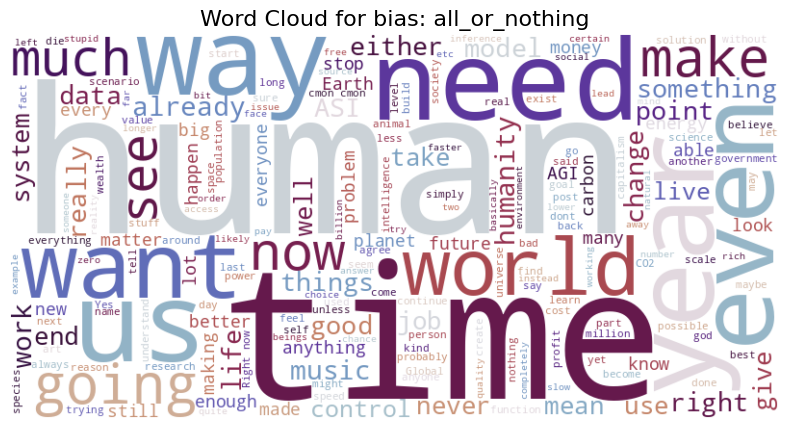

In [32]:
for base in bias_mapping.keys():
    subset = df[df[base] == True]
    text = " ".join(subset['text'].dropna().tolist())
    
    if text.strip():
        wordcloud = WordCloud(width=800, height=400, stopwords=stopwords, colormap = "twilight_shifted_r", background_color='white').generate(text)
        plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.title(f'Word Cloud for bias: {base}', fontsize=16)
        plt.show()
    else:
        print(f"No text found for bias: {base}")

# Topics

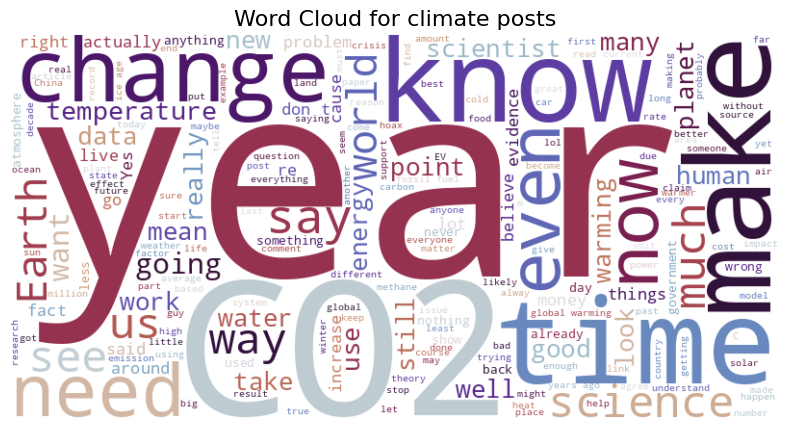

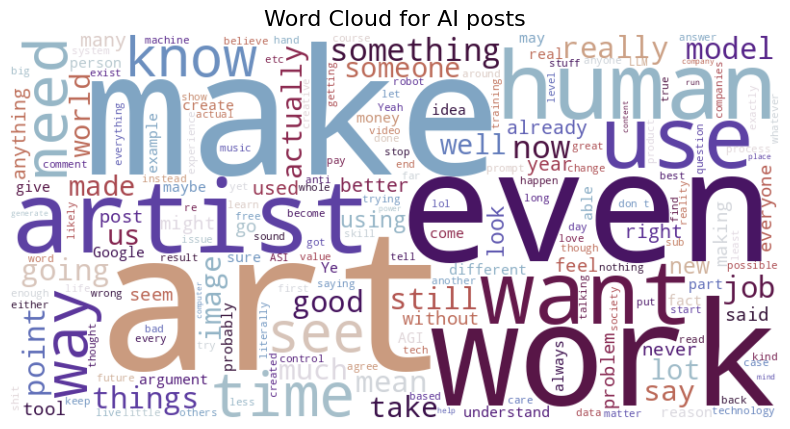

In [34]:
for topic in topics:
    subset = df[df['topic'].astype(str).str.contains(topic, case=False, na=False)]
    text = " ".join(subset['text'].dropna().tolist())
    
    if text.strip():
        wordcloud = WordCloud(width=800, height=400, stopwords=stopwords, colormap = "twilight_shifted_r", background_color='white').generate(text)
        plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.title(f'Word Cloud for {topic} posts', fontsize=16)
        plt.show()
    else:
        print(f"No text found for topic: {topic}")

# Each bias x topic

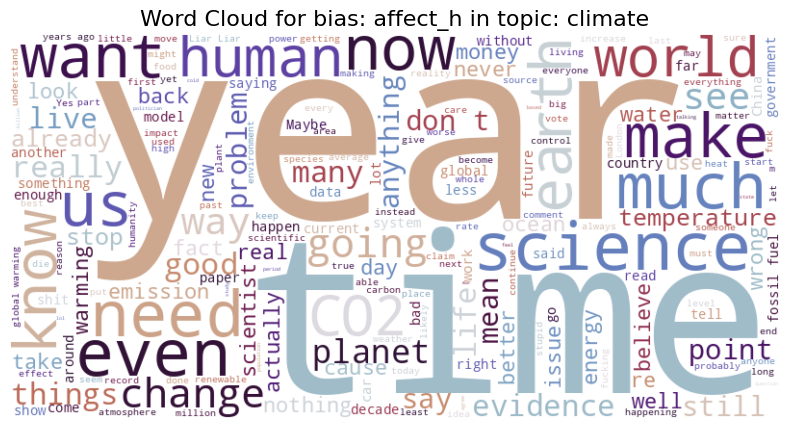

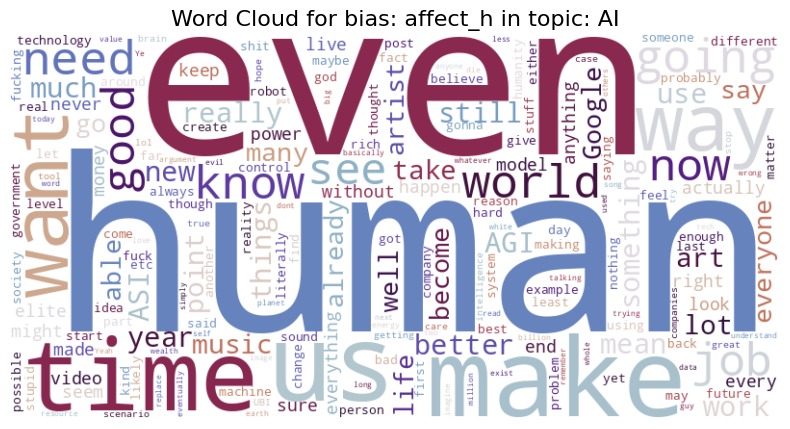

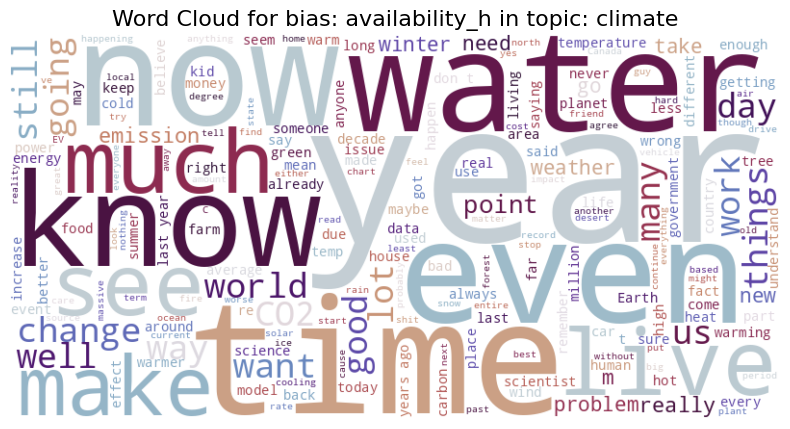

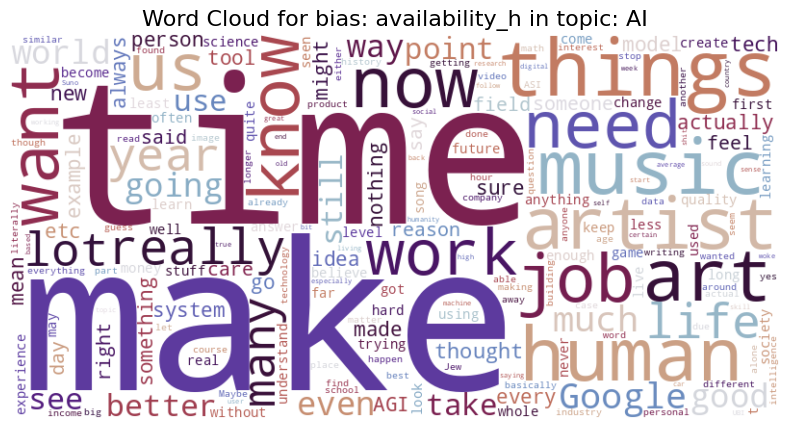

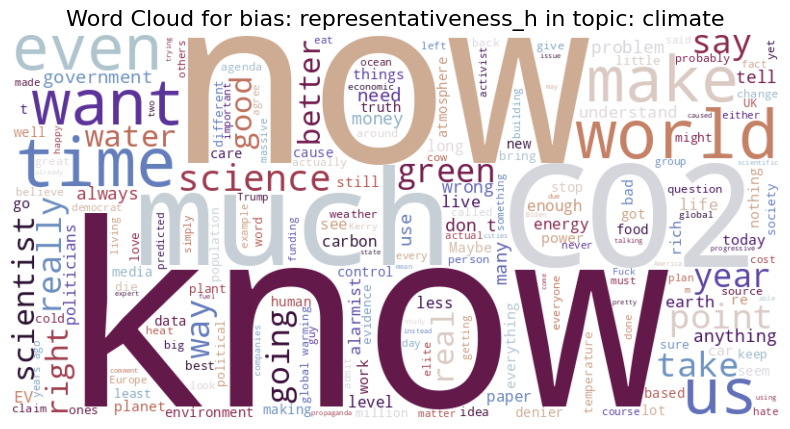

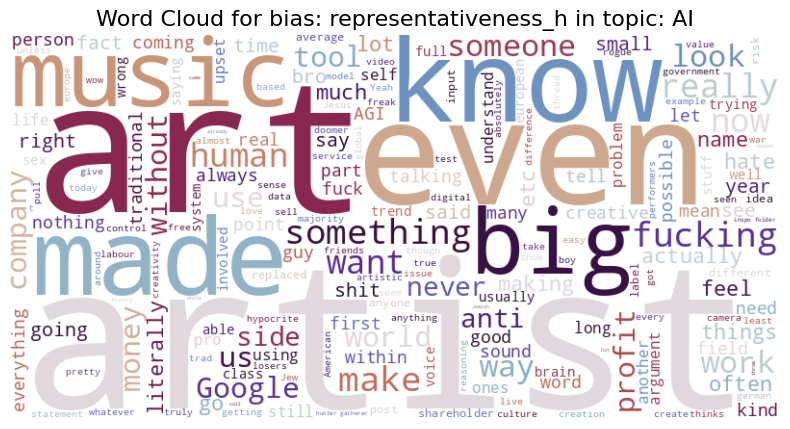

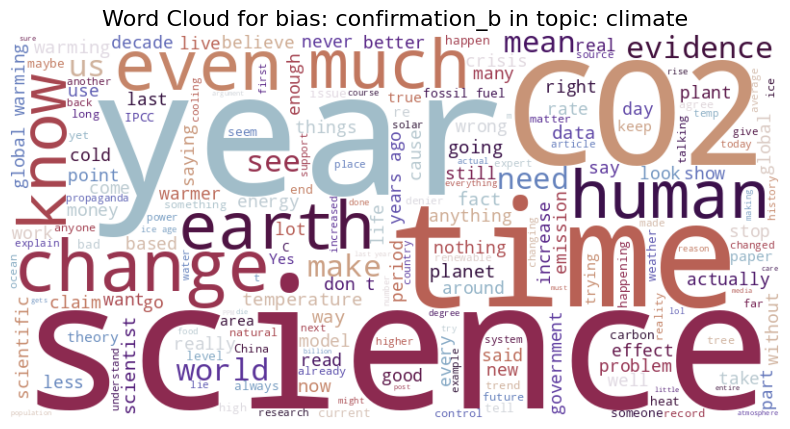

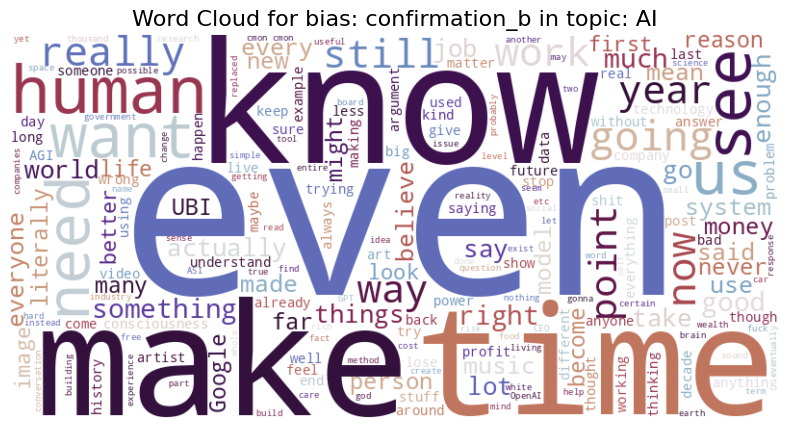

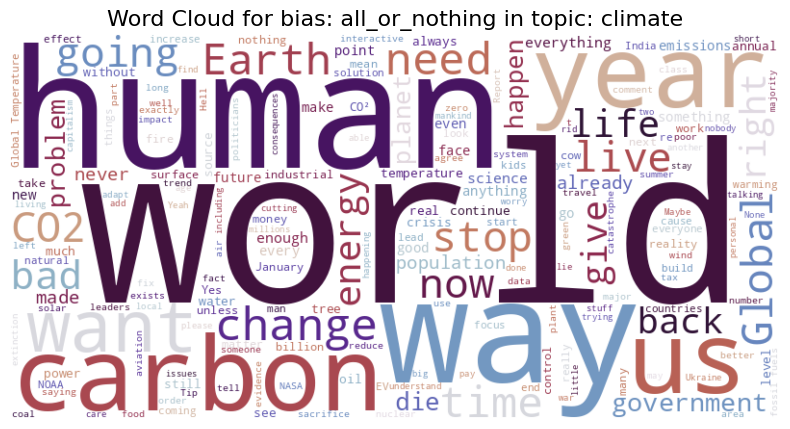

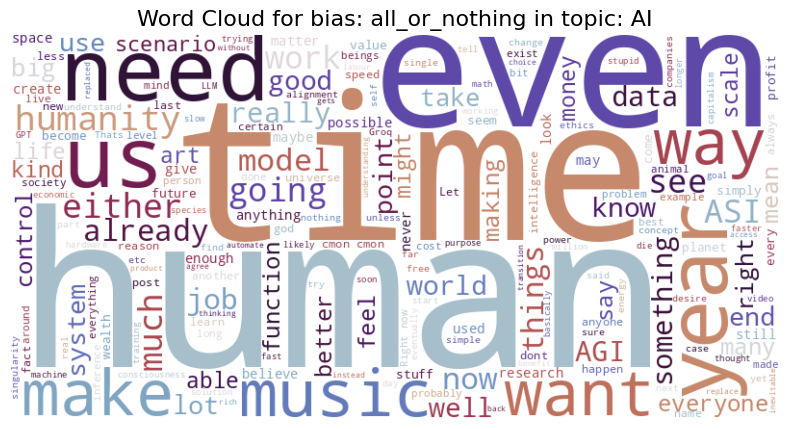

In [35]:
for base in bias_mapping.keys():
    for topic in topics:
        subset = df[(df[base] == True) & (df['topic'].astype(str).str.contains(topic, case=False, na=False))]
        text = " ".join(subset['text'].dropna().tolist())
        
        if text.strip():
            wordcloud = WordCloud(width=800, height=400, stopwords=stopwords, colormap = "twilight_shifted_r", background_color='white').generate(text)
            plt.figure(figsize=(10, 5))
            plt.imshow(wordcloud, interpolation='bilinear')
            plt.axis('off')
            plt.title(f'Word Cloud for bias: {base} in topic: {topic}', fontsize=16)
            plt.show()
        else:
            print(f"No text found for bias: {base} in topic: {topic}")

# Platforms

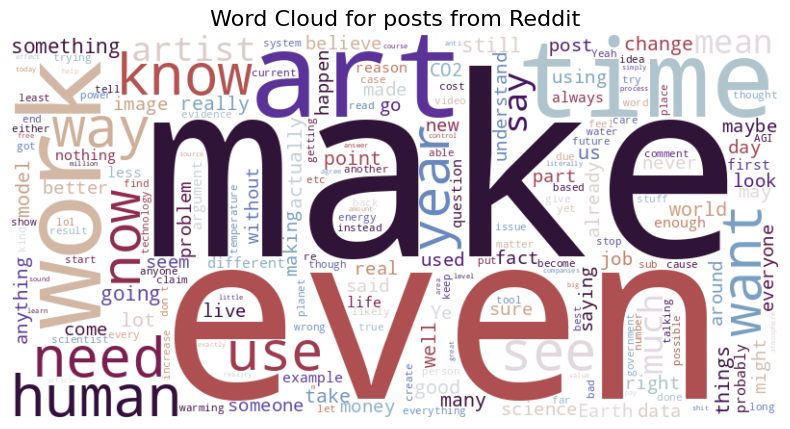

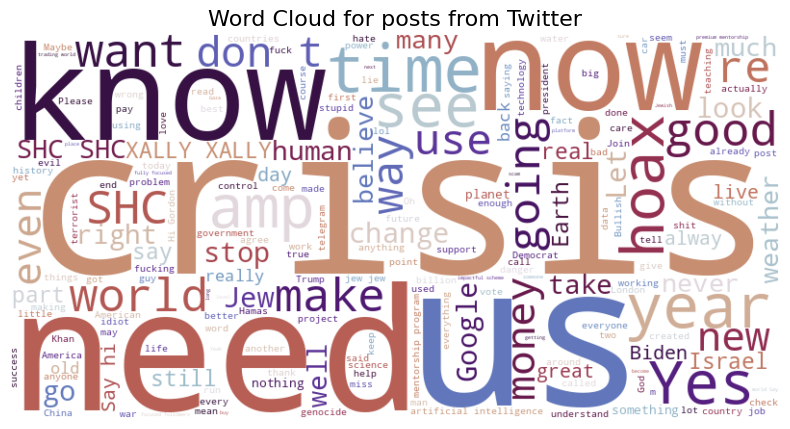

In [36]:
for platform in platforms:
    # Filter rows by platform (case-insensitive search in the "platform" column)
    subset = df[df['platform'].astype(str).str.contains(platform, case=False, na=False)]
    text = " ".join(subset['text'].dropna().tolist())
    
    if text.strip():
        wordcloud = WordCloud(width=800, height=400, stopwords=stopwords, colormap = "twilight_shifted_r", background_color='white').generate(text)
        plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.title(f'Word Cloud for posts from {platform}', fontsize=16)
        plt.show()
    else:
        print(f"No text found for platform: {platform}")

<img src="image-20250305-172225.png" width="" align="" />

## Each bias x platform

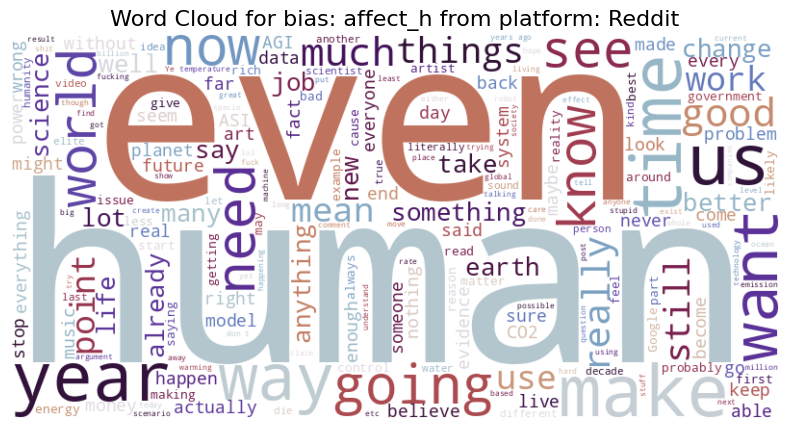

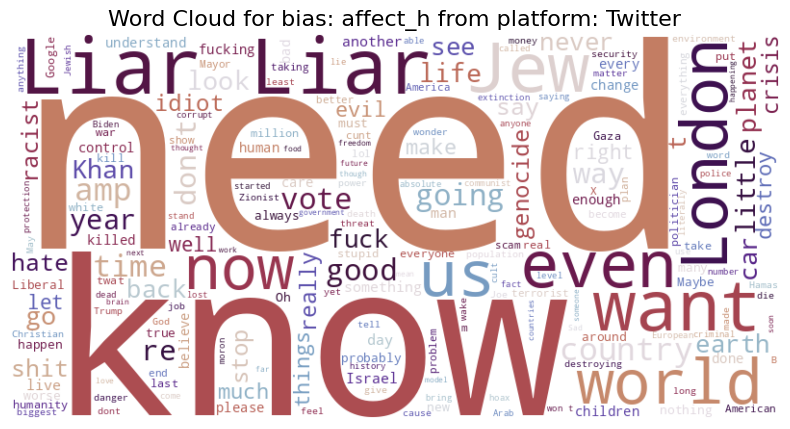

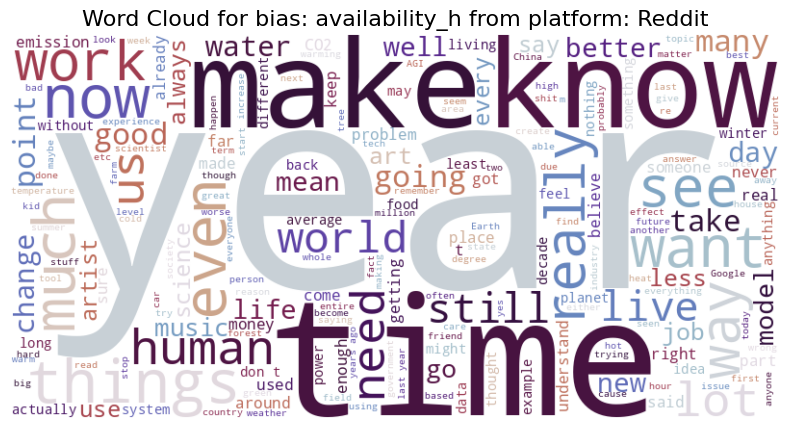

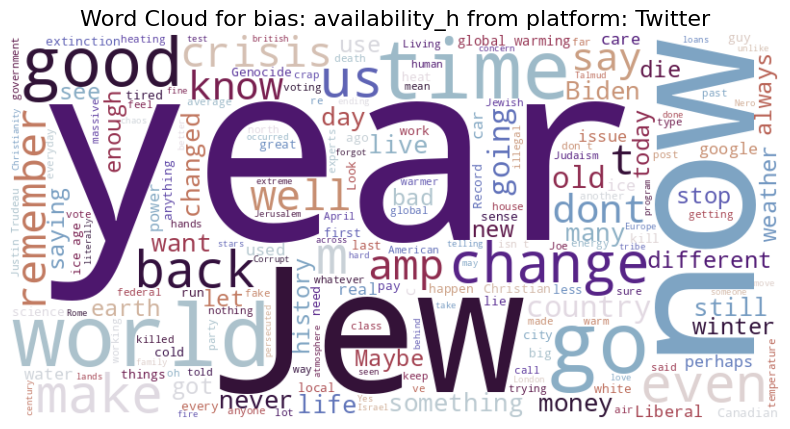

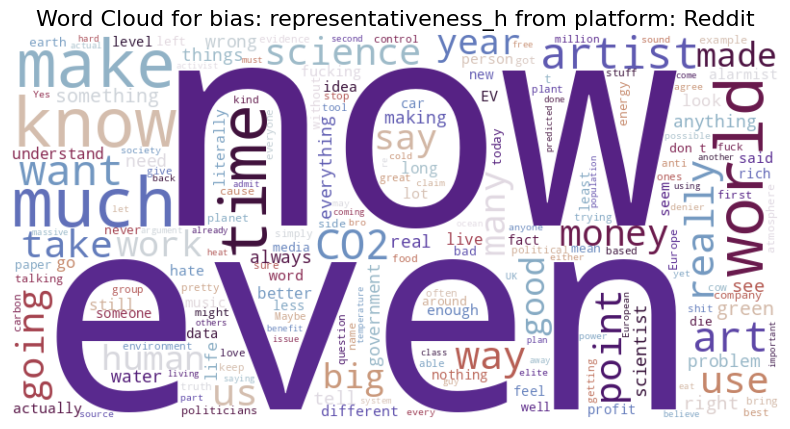

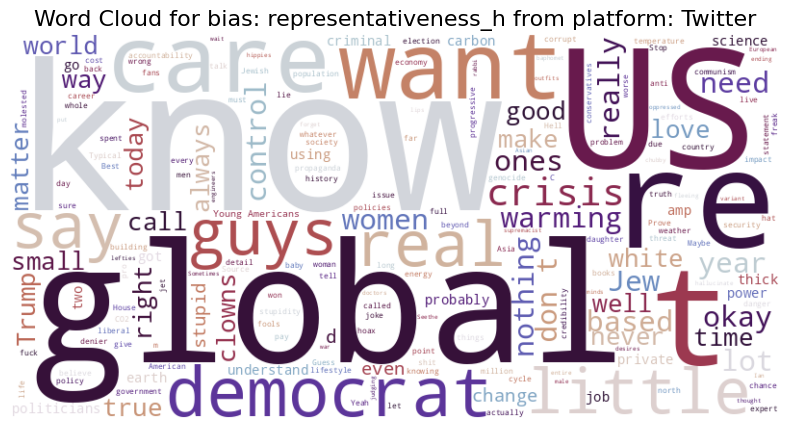

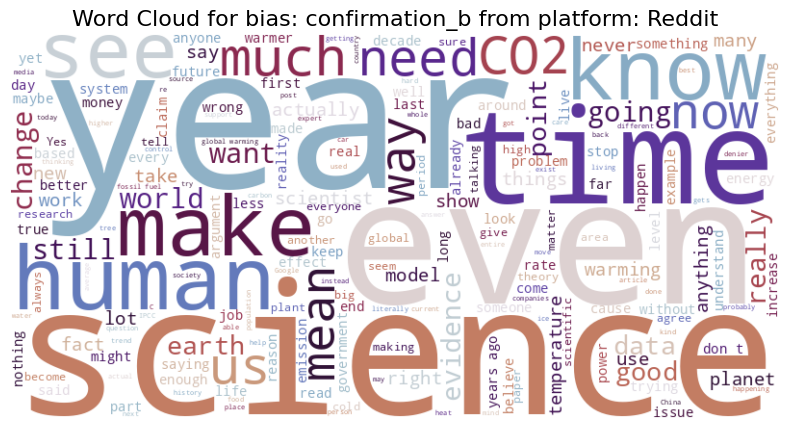

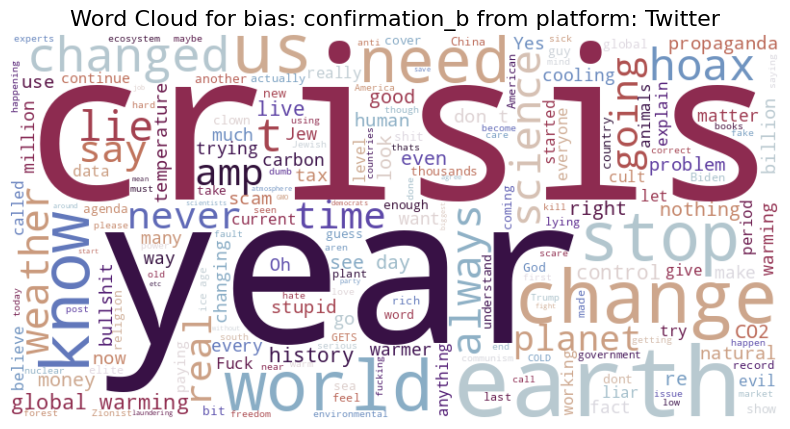

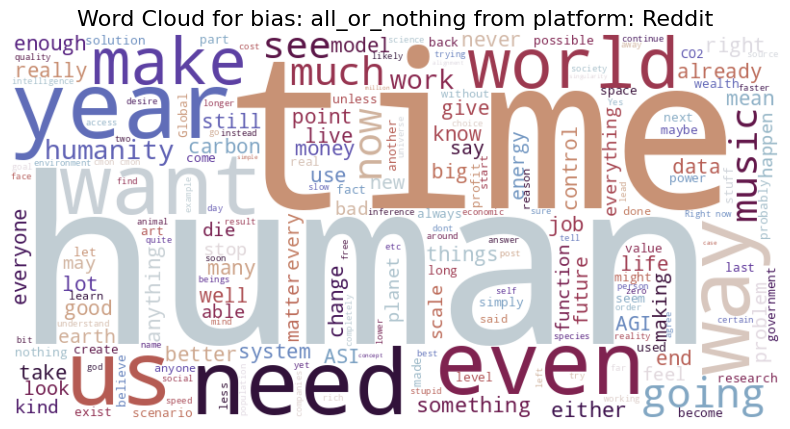

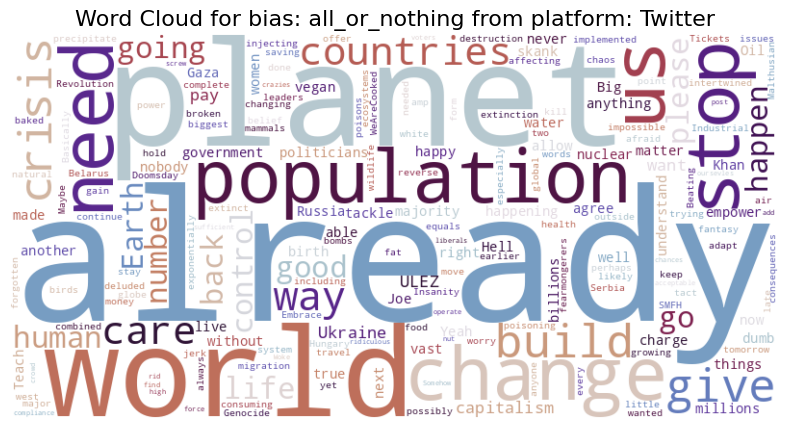

In [37]:
for base in bias_mapping.keys():
    for platform in platforms:
        subset = df[(df[base] == True) & (df['platform'].astype(str).str.contains(platform, case=False, na=False))]
        text = " ".join(subset['text'].dropna().tolist())
        
        if text.strip():
            wordcloud = WordCloud(width=800, height=400, stopwords=stopwords, colormap = "twilight_shifted_r", background_color='white').generate(text)
            plt.figure(figsize=(10, 5))
            plt.imshow(wordcloud, interpolation='bilinear')
            plt.axis('off')
            plt.title(f'Word Cloud for bias: {base} from platform: {platform}', fontsize=16)
            plt.show()
        else:
            print(f"No text found for bias: {base} from platform: {platform}")

# Collocations

Analysing the collocations helped draw conclusions from the word clouds.

## Imports

In [15]:
import nltk
from nltk.collocations import BigramCollocationFinder
from nltk.tokenize import word_tokenize

In [17]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

## Functions

In [19]:
def filter_dataframe(df, selected_bias="all", platform="all", topic="all", bias_column="bias"):
    """
    Filter the DataFrame based on:
      - Optionally filter by bias (using the given bias_column). If selected_bias is "all",
        no bias filtering is applied.
      - Optionally filter by platform if provided (and not set to "all").
      - Optionally filter by topic if provided (and not set to "all").
    
    Parameters:
      df (DataFrame): The complete dataset.
      selected_bias (str): The bias filter; use a specific value (e.g., '1') to filter by bias,
                           or "all" to include all rows regardless of bias.
      platform (str): Platform value (e.g., 'Reddit' or 'Twitter', or 'all' for no filtering).
      topic (str): Topic value (e.g., 'CC' or 'AI', or 'all' for no filtering).
      bias_column (str): Column name in the DataFrame that holds the bias annotation.
    
    Returns:
      DataFrame: Filtered DataFrame.
    """
    filtered_df = df.copy()
    
    # Filter by bias only if selected_bias is not "all"
    if selected_bias.lower() != "all":
        filtered_df = filtered_df[filtered_df[bias_column] == int(selected_bias)]
        
    # Filter by platform if provided and not "all"
    if platform.lower() != "all":
        filtered_df = filtered_df[filtered_df['platform'] == platform]
        
    # Filter by topic if provided and not "all"
    if topic.lower() != "all":
        filtered_df = filtered_df[filtered_df['topic'] == topic]
        
    return filtered_df


In [33]:
def get_collocations(texts, selected_word, top_n=20):
    """
    Given a list of texts, tokenize and compute bigram collocations that contain the selected word.
    
    Parameters:
      texts (list of str): List of text strings.
      selected_word (str): The word for which collocations are sought.
      top_n (int): Number of top collocations to return.
      
    Returns:
      List of tuples: Each tuple contains a bigram (as a tuple) and its frequency.
    """
    # Combine all texts into a single string
    combined_text = " ".join(texts)
    # Tokenize text and lower case for uniformity
    tokens = word_tokenize(combined_text.lower())
    
    # Create a BigramCollocationFinder from tokens
    finder = BigramCollocationFinder.from_words(tokens)
    
    # Filter to only keep bigrams that include the selected word
    collocations = []
    for bigram, freq in finder.ngram_fd.items():
        if selected_word.lower() in bigram:
            collocations.append((bigram, freq))
    
    # Sort collocations by frequency (descending) and return the top N
    collocations.sort(key=lambda x: x[1], reverse=True)
    return collocations[:top_n]

## Parameters

In [35]:
# If you want to filter by a specific bias, set selected_bias to that value (e.g., '1').
# If you want to include the whole dataset regardless of bias, set it to "all".
selected_bias = 'all'              # Options: '1' for filtering or 'all' to ignore bias.
selected_platform = 'Reddit'       # Use a specific platform (e.g., 'Reddit' or 'Twitter'), or "all".
selected_topic = 'all'             # Use a specific topic (e.g., 'CC' or 'AI'), or "all".
selected_word = 'make'          # The word to check collocations for.

## Collocations with a selected word

In [39]:
filtered_df = filter_dataframe(df, selected_bias, selected_platform, selected_topic, bias_column="bias")

if 'text' not in filtered_df.columns:
    raise ValueError("Expected a column named 'text' in the DataFrame.")

texts = filtered_df['text'].dropna().tolist()

collocs = get_collocations(texts, selected_word, top_n=20)

print(f"Top collocations with '{selected_word}' (within bias: {selected_bias}, platform: {selected_platform}, topic: {selected_topic}):")
for bigram, freq in collocs:
    print(f"{bigram} : {freq}")

Top collocations with 'make' (within bias: all, platform: Reddit, topic: all):
('to', 'make') : 900
('make', 'a') : 287
('make', 'it') : 260
('make', 'the') : 186
("n't", 'make') : 155
('can', 'make') : 146
('and', 'make') : 96
('you', 'make') : 85
('will', 'make') : 78
('make', 'you') : 73
('would', 'make') : 63
('make', 'sense') : 61
('make', 'sure') : 61
('make', 'art') : 61
('make', 'money') : 56
('make', 'an') : 54
('that', 'make') : 52
('make', 'them') : 49
('i', 'make') : 48
('not', 'make') : 47


### Tr- and quadgrams

In [ ]:
from nltk import word_tokenize, FreqDist
from nltk.util import ngrams

In [27]:
def apply_filters_to_dataframe(df, selected_bias="all", platform="all", topic="all", bias_column="bias"):
    """
    Filter the DataFrame based on:
      - Optionally filter by bias (using the given bias_column). If selected_bias is "all",
        no bias filtering is applied.
      - Optionally filter by platform if provided (and not set to "all").
      - Optionally filter by topic if provided (and not set to "all").
    
    Parameters:
      df (DataFrame): The complete dataset.
      selected_bias (str): The bias filter; use a specific value (e.g., '1') to filter by bias,
                           or "all" to include all rows regardless of bias.
      platform (str): Platform value (e.g., 'Reddit' or 'Twitter', or "all" for no filtering).
      topic (str): Topic value (e.g., 'CC' or 'AI', or "all" for no filtering).
      bias_column (str): Column name in the DataFrame that holds the bias annotation.
    
    Returns:
      DataFrame: Filtered DataFrame.
    """
    filtered_df = df.copy()
    
    # Filter by bias only if selected_bias is not "all"
    if selected_bias.lower() != "all":
        filtered_df = filtered_df[filtered_df[bias_column] == int(selected_bias)]
        
    # Filter by platform if provided and not "all"
    if platform.lower() != "all":
        filtered_df = filtered_df[filtered_df['platform'] == platform]
        
    # Filter by topic if provided and not "all"
    if topic.lower() != "all":
        filtered_df = filtered_df[filtered_df['topic'] == topic]
        
    return filtered_df

def extract_ngram_collocations(texts, selected_word, n=2, top_n=10):
    """
    Given a list of texts, tokenize and compute n-gram collocations that contain the selected word.
    
    Parameters:
      texts (list of str): List of text strings.
      selected_word (str): The word for which collocations are sought.
      n (int): The number of words in the collocation (e.g., 3 for trigrams, 4 for quadgrams).
      top_n (int): Number of top collocations to return.
      
    Returns:
      List of tuples: Each tuple contains an n-gram (as a tuple) and its frequency.
    """

    combined_text = " ".join(texts)
    tokens = word_tokenize(combined_text.lower())
    
    ngram_list = list(ngrams(tokens, n))
    freq_dist = FreqDist(ngram_list)
    
    collocations = []
    for gram, freq in freq_dist.items():
        if selected_word.lower() in gram:
            collocations.append((gram, freq))
    
    collocations.sort(key=lambda x: x[1], reverse=True)
    return collocations[:top_n]

In [29]:
selected_bias = 'all'              # Options: '1' for filtering or 'all' to ignore bias.
selected_platform = 'Reddit'       # Use a specific platform (e.g., 'Reddit' or 'Twitter'), or "all".
selected_topic = 'all'             # Use a specific topic (e.g., 'CC' or 'AI'), or "all".
selected_word = 'make'             # The word to check collocations for.

In [31]:
filtered_df = apply_filters_to_dataframe(df, selected_bias, selected_platform, selected_topic, bias_column="bias")

if 'text' not in filtered_df.columns:
    raise ValueError("Expected a column named 'text' in the DataFrame.")

texts = filtered_df['text'].dropna().tolist()

collocs_3 = extract_ngram_collocations(texts, selected_word, n=3, top_n=10)
collocs_4 = extract_ngram_collocations(texts, selected_word, n=4, top_n=10)

print(f"Top 3-word collocations with '{selected_word}' (bias: {selected_bias}, platform: {selected_platform}, topic: {selected_topic}):")
for gram, freq in collocs_3:
    print(f"{gram} : {freq}")

print("\nTop 4-word collocations:")
for gram, freq in collocs_4:
    print(f"{gram} : {freq}")

Top 3-word collocations with 'make' (bias: all, platform: Reddit, topic: all):
('to', 'make', 'a') : 119
('to', 'make', 'it') : 85
('to', 'make', 'the') : 84
('does', "n't", 'make') : 74
('want', 'to', 'make') : 55
('trying', 'to', 'make') : 45
('you', 'can', 'make') : 38
('to', 'make', 'sure') : 35
('to', 'make', 'art') : 29
("n't", 'make', 'it') : 28

Top 4-word collocations:
('it', 'does', "n't", 'make') : 21
('does', "n't", 'make', 'it') : 19
('you', 'want', 'to', 'make') : 15
('be', 'able', 'to', 'make') : 15
('that', 'does', "n't", 'make') : 15
('doesn', '’', 't', 'make') : 14
('does', "n't", 'make', 'sense') : 14
('to', 'make', 'a', 'living') : 12
('make', 'money', 'off', 'of') : 10
('i', 'want', 'to', 'make') : 10


<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=57b17465-b515-43be-9dff-cc539004fde2' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>